In [1]:
import numpy as np
import pandas as pd
from retinaface import RetinaFace
from tensorflow import expand_dims
import joblib
import PIL.Image
import PIL.ImageDraw
import PIL.ImageFont

In [2]:
emotion_map = {0: 'Angry', 1: 'Digust', 2: 'Fear',
                   3: 'Happy', 4: 'Sad', 5: 'Surprise', 6: 'Neutral'}

faces = RetinaFace.extract_faces(img_path = "../raw_data/foto_vel.jpg",
                                 model='' 
                                 align = False)

data = np.zeros(shape=(len(faces), 48, 48), dtype = 'float64')

for i, face in enumerate(faces):
    face_bw = np.array(PIL.Image.fromarray(faces[i])
               .convert("L")
               .resize((48, 48), PIL.Image.ANTIALIAS))
    data[i]=face_bw
    
data = (data/255) -0.5
data = expand_dims(data, axis=-1)

model = joblib.load('../model.joblib')
results = model.predict(data)

emotion_results = np.vectorize(emotion_map.get)(results.argmax(axis = 1))
emotion_values =  results.max(axis = 1)

emotion_df = pd.DataFrame(data={'Emotion': emotion_map.values(), 
              'Percentage': np.mean(results,axis=0)})

emotion_df = emotion_df.sort_values(by='Percentage',ascending=False)
emotion_df.head(3)



,Emotion,Percentage
4,Sad,0.327609
6,Neutral,0.181167
0,Angry,0.178112


In [3]:
resp = RetinaFace.detect_faces( "../raw_data/foto_vel.jpg",
                               allow_upscaling = False)

scores = []
faces_area = []
for inner_dict in resp.values():
    scores.append(inner_dict.get('score'))
    faces_area.append(inner_dict.get('facial_area'))


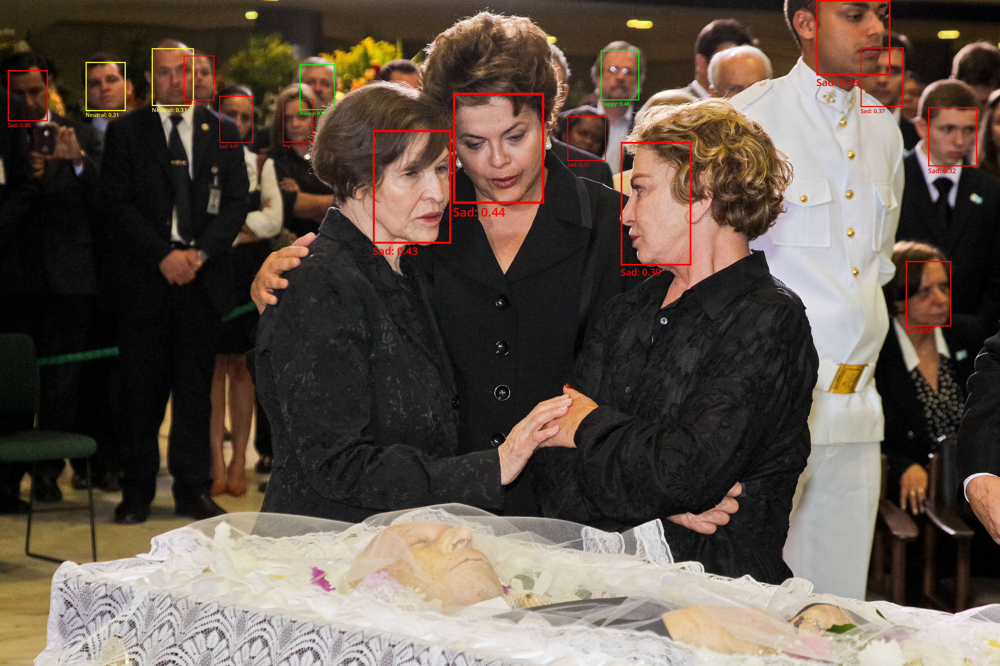

In [4]:
image = PIL.Image.open("../raw_data/foto_vel.jpg")
image_to_draw = PIL.ImageDraw.Draw(image)
font = PIL.ImageFont.load_default()

def emotion_colors(emotion):
    emotion_dict = {'Angry':'#ff0000','Digust':'#ff0000', 'Fear':'#ff0000',
                   'Happy':'#00ff00', 'Sad':'#ff0000',
                   'Surprise':'#ffff00','Neutral':'#ffff00'}
    
    
    return emotion_dict.get(emotion)
for i,face_rect in enumerate(faces_area):
    color = emotion_colors(emotion_results[i])
    box_length = face_rect[2]-face_rect[0]
    text_size = int(np.ceil(box_length/7.5))
    outline_size = int(np.ceil(box_length/45))
    
    image_to_draw.rectangle(face_rect,outline=color ,width=outline_size)
    
    
    
    font_L = PIL.ImageFont.truetype("../resources/OpenSans-SemiBold.ttf",
                                    text_size)
    text_bbox = f'{emotion_results[i]}: {emotion_values[i]:.2f}' 
    image_to_draw.multiline_text((face_rect[0],face_rect[3]),font = font_L,
                                 text = text_bbox,  fill=color)
image